<a href="https://colab.research.google.com/github/ttcielott/animal_image_classifier/blob/main/animal_image_classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from fastcore.all import *
import time
import json

In [ ]:
def search_images(term, max_images=200):
    url = 'https://duckduckgo.com/'
    res = urlread(url,data={'q':term})
    searchObj = re.search(r'vqd=([\d-]+)\&', res)
    requestUrl = url + 'i.js'
    params = dict(l='us-en', o='json', q=term, vqd=searchObj.group(1), f=',,,', p='1', v7exp='a')    
    headers = dict( referer='https://duckduckgo.com/' )
    urls,data = set(),{'next':1}
    while len(urls)<max_images and 'next' in data:
        res = urlread(requestUrl, data=params, headers=headers)
        data = json.loads(res) if res else {}
        urls.update(L(data['results']).itemgot('image'))
        requestUrl = url + data['next']
        time.sleep(0.2)
    return L(urls)[:max_images]

In [ ]:
urls = search_images('cheetah photos', max_images = 1)
urls[0]

'http://weknowyourdreams.com/images/cheetah/cheetah-03.jpg'

In [ ]:
from fastdownload import download_url

In [ ]:
dest = 'cheetah.jpg'
download_url(urls[0], dest, show_progress = False)

Path('cheetah.jpg')

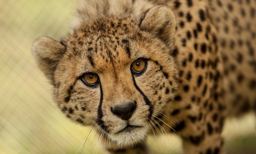

In [ ]:
from fastai.vision.all import *
im = Image.open(dest)
im.to_thumb(256, 256)

In [ ]:
urls = search_images('elephant photos', max_images = 1)
urls[0]

'https://www.catersnews.com/wp-content/uploads/2018/05/4_MPM_ELEPHANTS_IN_TANGLE-05.jpg'

In [ ]:
dest = 'elephant.jpg'
download_url(urls[0], dest, show_progress = False)

Path('elephant.jpg')

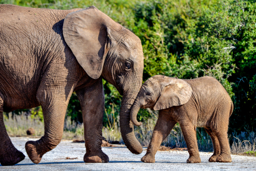

In [ ]:
im = Image.open(dest)
im.to_thumb(256, 256)

In [ ]:
urls = search_images('zebra photos', max_images = 1)
urls[0]

'http://www.publicdomainpictures.net/pictures/40000/velka/young-zebra.jpg'

In [ ]:
dest = 'zebra.jpg'
download_url(urls[0], dest, show_progress = False)

Path('zebra.jpg')

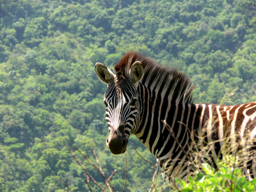

In [ ]:
im = Image.open(dest)
im.to_thumb(256, 256)

In [ ]:
urls = search_images('gazel photos', max_images = 1)
urls[0]

'https://www.zoochat.com/community/media/grants-gazelle.314836/full?d=1454378292'

In [ ]:
dest = 'gazel.jpg'
download_url(urls[0], dest, show_progress = False)

Path('gazel.jpg')

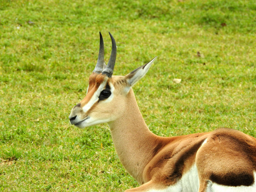

In [ ]:
im = Image.open(dest)
im.to_thumb(256, 256)

In [ ]:
import os
os.listdir()

['.config',
 'cheetah.jpg',
 'zebra.jpg',
 'elephant.jpg',
 'gazel.jpg',
 'sample_data']

In [ ]:
labels = 'cheetah', 'elephant', 'zebra', 'gazel'
path = Path('animals')

for o in labels:
  dest = (path/o)
  dest.mkdir(exist_ok = True, parents = True)
  download_images(dest, urls = search_images(f'{o} photo'))
  resize_images(path/o, max_size = 400, dest = path/o)

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:2800: DecompressionBombWarning: Image size (125255808 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


In [ ]:
failed = verify_images(get_image_files(path))
failed.map(Path.unlink) # delete the failed image links
len(failed)

4

In [ ]:
data = DataBlock(
    blocks = (ImageBlock, CategoryBlock),
    get_items = get_image_files,
    splitter = RandomSplitter(valid_pct=0.2, seed = 42),
    get_y = parent_label,
    item_tfms = Resize(128)
)

In [ ]:
dls = data.dataloaders(path)

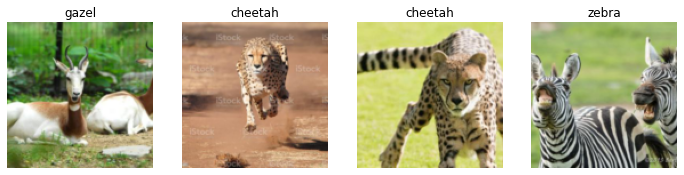

In [ ]:
dls.valid.show_batch(max_n = 4, nrows = 1)

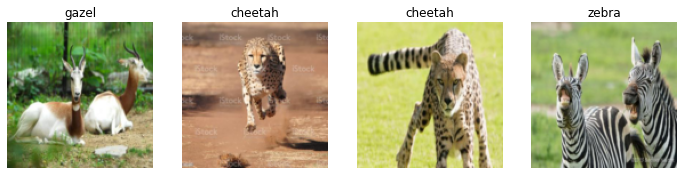

In [ ]:
# resizing: squish
data = data.new(item_tfms = Resize(128, ResizeMethod.Squish))
dls = data.dataloaders(path)
dls.valid.show_batch(max_n = 4, nrows = 1)

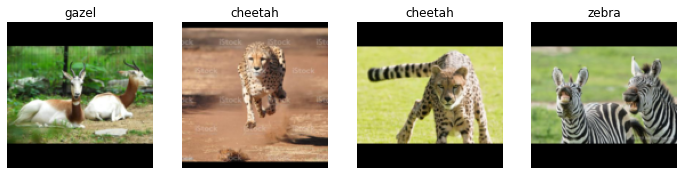

In [ ]:
# resizing: pad (add borders to make all images have the same size)
data = data.new(item_tfms = Resize(128, ResizeMethod.Pad, pad_mode = 'zeros'))
dls = data.dataloaders(path)
dls.valid.show_batch(max_n = 4, nrows=1, unique = False)


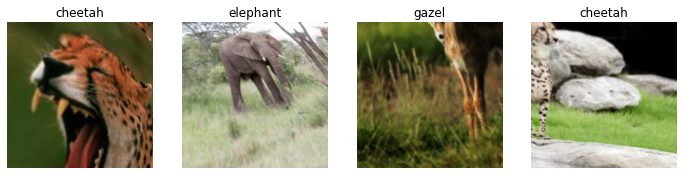

In [ ]:
# resizing: crop
# data augmentation: by using a single image, create many images

data = data.new(item_tfms = RandomResizedCrop(224, min_scale = 0.03), 
batch_tfms = aug_transforms(mult = 2))
dls = data.dataloaders(path)
dls.train.show_batch(max_n = 4, nrows = 1, unique = False)

**Resizing**

**item_tfms** — *we have images of different sizes and this causes a problem *
because we always send a batch of files to the model instead of a single file; therefore we need to preprocess these images by resizing them to a standard and then group them in a tensor to pass through the model.

**Data Augmentation**
 
*We can add transformations to these images to create random variations of the input images*, such that they appear different but still represent the same facts.

We can rotate, warp, flip, or change the brightness/contrast of the images to create these variations. We also have a standard set of augmentations encapsulated in **aug_transforms** function that works pretty well for a majority of computer vision datasets.

We can now apply these transformations to an entire batch of images as all the images are of the same size(224 pixels, standard for image classification problems) 

https://www.kdnuggets.com/2020/11/building-deep-learning-projects-fastai-model-training-deployment.html

In [ ]:
# train model 
learn = vision_learner(dls, resnet18, metrics = error_rate)
learn.fine_tune(5)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


  0%|          | 0.00/44.7M [00:00<?, ?B/s]

epoch,train_loss,valid_loss,error_rate,time
0,1.301766,0.026945,0.006667,00:07


epoch,train_loss,valid_loss,error_rate,time
0,0.303649,0.036251,0.006667,00:03
1,0.303649,0.040197,0.006667,00:04
2,0.262855,0.041935,0.006667,00:03
3,0.264662,0.040640,0.006667,00:03
4,0.247149,0.038475,0.006667,00:03


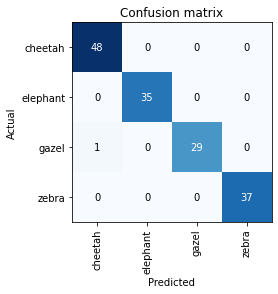

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

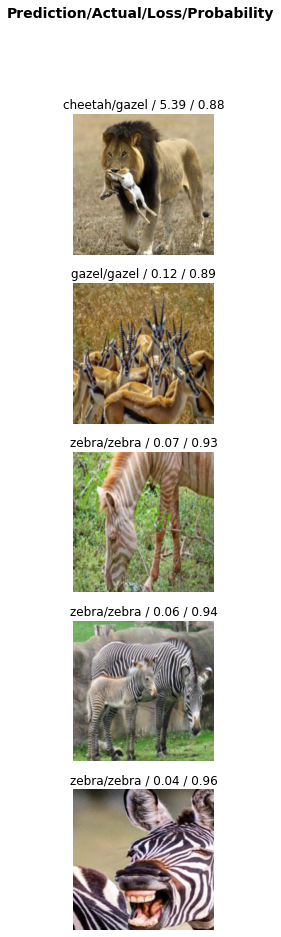

In [ ]:
interp.plot_top_losses(5, nrows = 5)

In [ ]:
!pip install -Uqq fastbook

     |████████████████████████████████| 719 kB 27.5 MB/s 
     |████████████████████████████████| 1.3 MB 63.5 MB/s 
     |████████████████████████████████| 432 kB 59.0 MB/s 
     |████████████████████████████████| 4.9 MB 62.3 MB/s 
     |████████████████████████████████| 163 kB 69.8 MB/s 
     |████████████████████████████████| 212 kB 73.4 MB/s 
     |████████████████████████████████| 115 kB 73.8 MB/s 
     |████████████████████████████████| 127 kB 74.4 MB/s 
     |████████████████████████████████| 6.6 MB 50.1 MB/s 


In [ ]:
from fastbook import *
from fastai.vision.widgets import *

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

In [ ]:
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
for idx, cat in cleaner.change(): shutil.move(str(cleaner.fns[idx], path/cat))

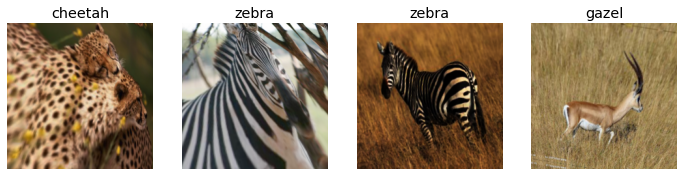

In [ ]:

data = data.new(item_tfms = Resize(224, ResizeMethod.Squish)
, batch_tfms = aug_transforms(mult = 2))
dls = data.dataloaders(path)
dls.train.show_batch(max_n = 4, nrows = 1, unique = False)

In [ ]:
# train model 
learn = vision_learner(dls, resnet18, metrics = error_rate)
learn.fine_tune(8)

epoch,train_loss,valid_loss,error_rate,time
0,1.179046,0.057869,0.006667,00:04


epoch,train_loss,valid_loss,error_rate,time
0,0.115861,0.048138,0.026667,00:04
1,0.088103,0.046450,0.013333,00:04
2,0.062940,0.038904,0.013333,00:04
3,0.047211,0.034709,0.013333,00:04
4,0.041896,0.035397,0.013333,00:04
5,0.032025,0.046797,0.020000,00:04
6,0.026918,0.052730,0.020000,00:04
7,0.023423,0.053202,0.013333,00:04


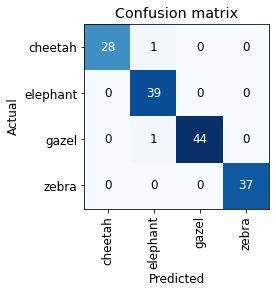

In [ ]:
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()

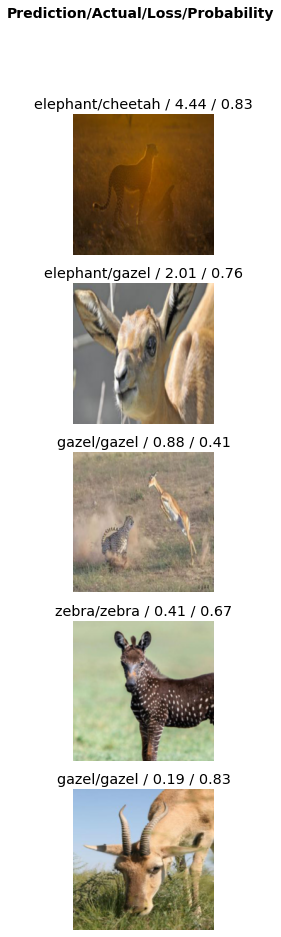

In [ ]:
interp.plot_top_losses(5, nrows = 5)


In [ ]:
cleaner

In [ ]:
learn.export()

In [ ]:
labels = learn.dls.vocab

In [ ]:
labels

['cheetah', 'elephant', 'gazel', 'zebra']

In [ ]:
def predict(img):
  img = PILImage.create(img)
  pred, pred_idx, probs = learn.predict(img)
  return {labels[i]: float(probs[i]) for i in range(len(labels))}

In [ ]:
!pip install -Uqq gradio

     |████████████████████████████████| 5.3 MB 31.6 MB/s 
     |████████████████████████████████| 212 kB 73.8 MB/s 
     |████████████████████████████████| 84 kB 3.8 MB/s 
     |████████████████████████████████| 112 kB 75.0 MB/s 
     |████████████████████████████████| 57 kB 5.9 MB/s 
     |████████████████████████████████| 55 kB 3.8 MB/s 
     |████████████████████████████████| 2.3 MB 57.9 MB/s 
     |████████████████████████████████| 270 kB 66.9 MB/s 
     |████████████████████████████████| 54 kB 3.8 MB/s 
     |████████████████████████████████| 84 kB 3.7 MB/s 
     |████████████████████████████████| 63 kB 2.4 MB/s 
     |████████████████████████████████| 80 kB 10.4 MB/s 
     |████████████████████████████████| 68 kB 6.7 MB/s 
     |████████████████████████████████| 46 kB 4.8 MB/s 
     |████████████████████████████████| 856 kB 64.9 MB/s 
     |████████████████████████████████| 4.0 MB 63.7 MB/s 
     |████████████████████████████████| 594 kB 67.7 MB/s 


In [ ]:
import gradio as gr
from gradio.components import Image, Label

In [ ]:
gr.Interface(fn = predict, inputs = Image(shape=(224,224)),
             outputs = Label(num_top_classes = 4)).launch(share = True)

Colab notebook detected. To show errors in colab notebook, set `debug=True` in `launch()`
Running on public URL: https://14640.gradio.app

This share link expires in 72 hours. For free permanent hosting, check out Spaces: https://huggingface.co/spaces


(<gradio.routes.App at 0x7f3277512a50>,
 'http://127.0.0.1:7860/',
 'https://14640.gradio.app')